<a href="https://colab.research.google.com/github/Gwgoof/dog-breed-classification/blob/master/end_to_end_dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **End-to-end Multi-class Dog Breed Classification**

In this project I am going to be using machine learning to identify different breeds of dogs. To do this I am going to build an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

This kind of a problem is called a multi-class image classification. It is multi-class because I am trying to classify mutliple different breeds of dogs. If I was only trying to differentiate between dogs and cats, it would be called a binary classification (one thing versus another).

**Fun Fact:** Multi-class image classification is the kind of technology Tesla uses in their self-driving cars and Airbnb uses to automatically add features and amenities to their listings based on imagery.

#### **1. The Problem**

Identifying the breed of any given image of a dog.

#### **2. Data**

The data I will be using is from the dog breed identification competition on [Kaggle](https://www.kaggle.com/c/dog-breed-identification/data).

#### **3. Evaluation**

[The evaluation](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation) is a file with prediction probabilities for each dog breed of each test image.

#### **4. Features**

Some information about the data:
* These are images (unstructured data) so it's probably best to use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because I need to predict them).

#### **5. My Workflow**

* Get the data (download, store, import).
* Prepare the data (preprocessing, 3 sets, X & y).
* Choose, fit and train model (TensorFlow Hub, tf.keras.applications, TensorBoard, EarlyStopping).
* Evaluate model (make predictions, comparing them with the ground truth labels).
* Improve model through experimentation (start with 1000 images, make sure it works, increase to full dataset of images).
* Save, share and reload model (once happy with the results).

To preprocess the data, I am going to use **TensorFlow 2.x**. The whole premise here is to get the data into **Tensors** (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For the machine learning model, I'm going to be using a pretrained deep learning model from **TensorFlow Hub**.

**Fun Fact:** The process of using a pretrained model and adapting it to your own problem is called **transfer learning**. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has already been trained to classify images.


#### **Workspace**

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [109]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.2.0


In [110]:
# Run this cell if TensorFlow 2.x isn't the default in Colab
try:
  # %tensorflow_version magic function only exists in Colab
  %tensorflow_version 2.x
except Exception:
  pass

print("TF version:", tf.__version__)

TF version: 2.2.0


In [111]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.2.0
TF Hub version: 0.8.0
GPU available


**NOTE:** Running this for the first time in Colab will let us know there's no GPU available. By default Colab runs on a computer without a GPU attached. You fix this by going to "Runtime" and then changing the "Runtime Type".

#### **Getting the data ready (turning it into Tensors)**

As with all machine learning models, the data has to be in a numerical format. So the first step will be to turn the images into Tensors (numerical representations).

In [112]:
# Upload and Unzip the data in Google Drive (Mount Google Drive to Google Colab if using for the first time)
#!unzip "drive/My Drive/Projects/Dog Breed Classification/dog-breed-identification.zip" -d "drive/My Drive/Projects/Dog Breed Classification/"

In [115]:
# Take a look at the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Projects/Dog Breed Classification/labels.csv")

In [116]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,564f6459771be13539c5caeec1258fde,scottish_deerhound
freq,1,126


There are 10222 different ID's (meaning 10222 different images) and 120 different unique breeds.

In [117]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [118]:
# Check how many images there are of each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

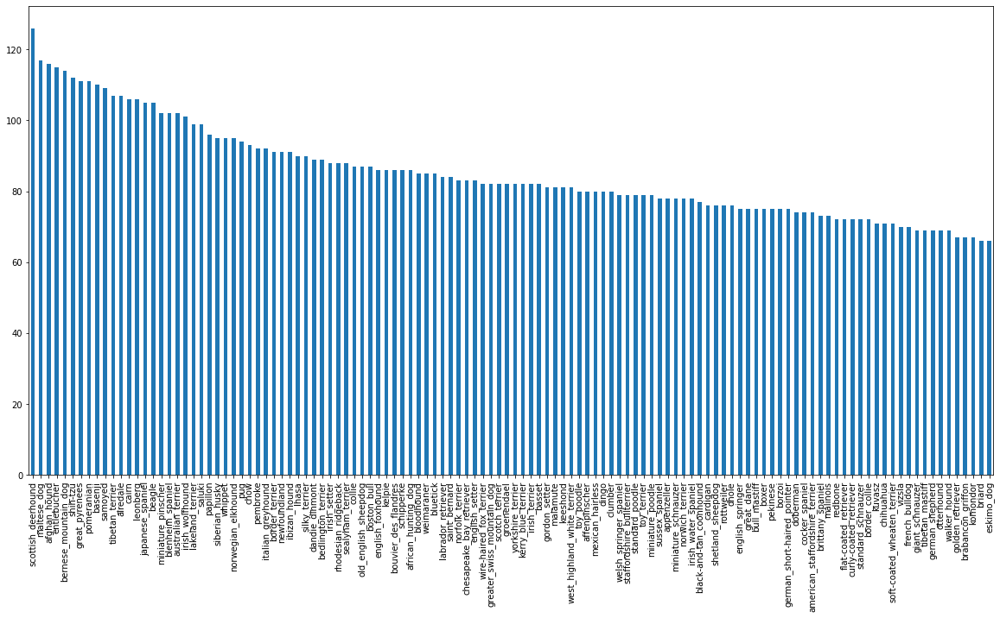

In [119]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [120]:
labels_csv["breed"].value_counts().median()

82.0

In [121]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

**Note:** Google recommends a minimum of 10 images per class to get started when using their image products. The more images per class are available, the more chance a model has to figure out patterns between them.

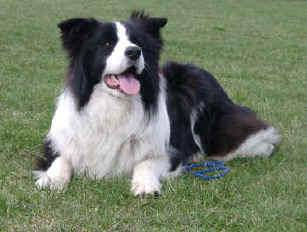

In [123]:
# View an imagine in line
from IPython.display import display, Image
Image("drive/My Drive/Projects/Dog Breed Classification/train/0b346cec75418439f13eabdc7e96f33a.jpg")

#### **Getting images and their labels**

Now that I have the image ID's and their labels in a DataFrame (`labels_csv`), I will use these to create:
* A list of filepaths to training images
* An array of all labels
* An array of all unique labels

**Note:** Working with file paths (strings) is much more efficient than working with actual images. Therefore I will create a list of filepaths to my images rather than importing all of the images.

In [124]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Projects/Dog Breed Classification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
filenames[:10]

['drive/My Drive/Projects/Dog Breed Classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Now that I have a list of all the filenames from the ID column of labels_csv, I can compare it to the number of files in my training data directory to see if they line up.

**NOTE:** If they do not line up, there may have been an issue unzipping the data (above). To fix this, you might have to unzip the data again and make sure not to let the Colab notebook disconnect whilst unzipping.

In [125]:
len(filenames)

10222

In [126]:
# Check whether the number of filenames matches the number of actual image files in the Google Drive folder
import os
if len(os.listdir("drive/My Drive/Projects/Dog Breed Classification/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


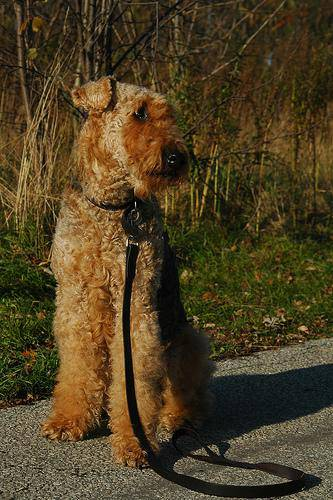

In [132]:
# Check an image directly from a filepath
Image(filenames[5000])

In [133]:
labels_csv['breed'][5000]

'airedale'

In [134]:
# Gather all labels from `labels_csv`
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)  # convert labels column to NumPy array
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [135]:
len(labels)

10222

In [136]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


**Note:** A machine learning model can't take strings as inputs (which `labels` currently is), so I will have to convert my labels to numbers. 

First find all the unique dog breed names. Then go through the list of `labels` and compare them to unique breeds and create a list of booleans indicating which one is the real label (`True`) and which ones aren't (`False`).

In [137]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [138]:
unique_breeds[:10]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle'], dtype=object)

In [139]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [140]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [141]:
len(boolean_labels)

10222

In [142]:
# Example: Turning boolean array into intergers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where teh sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [144]:
print(labels[2]) # original label
print(np.where(unique_breeds == labels[2])) # index where label occurs
print(boolean_labels[2].argmax()) # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # there will be a "1" where the sample label occurs

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [145]:
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [146]:
filenames[:10]

['drive/My Drive/Projects/Dog Breed Classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

#### **Creating the validation set**

Since the Kaggle dataset doesn't come with a validation set we have to create one.

In [147]:
# Setup X & y variables
X = filenames
y = boolean_labels

X[1], y[1]

('drive/My Drive/Projects/Dog Breed Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, Fa

In [148]:
len(filenames)

10222

**Note:** It is always best to start off experimenting with some of your data first (e.g. ~1000 images) and then increase the dataset from there.

In [149]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [150]:
# Split data into training and validation sets
from sklearn.model_selection import train_test_split

# Split data into X and y with our NUM_IMAGES limit
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [151]:
# Review and verify having achieved the desired data (content and shape)
X_train[:2], y_train[:2]

(['drive/My Drive/Projects/Dog Breed Classification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Projects/Dog Breed Classification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

#### **Preprocessing Images (turning images into Tensors: numerical representation of images to use with TensorFlow)**

Write a function to preprocess images into Tensors:

1. Take an image filename as input.
2. Use TensorFlow to read file and save it to a variable, image.
3. Turn the image (jpeg) into Tensors.
4. Resize the image to be of shape (224, 224).
5. Return the modified image.

- Loading images: https://www.tensorflow.org/tutorials/load_data/images
- Converting images: https://www.tensorflow.org/guide/data

In [155]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # read in an image
image.shape

(257, 350, 3)

*height, width, colour channel value*

In [156]:
image.max(), image.min()

(255, 0)

*pixel tones*

In [157]:
# What an image array looks like
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

I will run some isolated tests of each of the functions required components...

In [158]:
# Example/Test: Read in image file

# tensor_test = tf.io.read_file(filenames[5])
# tensor_test

In [159]:
# Example/Test: Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)

# tensor_test = tf.image.decode_jpeg(tensor_test, channels=3)
# tensor_test

In [160]:
# Example/Test: Convert the colour channel values from 0-225 values to 0-1 values

# tensor_test = tf.image.convert_image_dtype(tensor_test, tf.float32)
# tensor_test

In [161]:
# tensor_test.shape

In [162]:
# Define image size
IMG_SIZE = 224

In [163]:
# Emaple/Test: Resize the image to our desired size (224, 244)

# tensor_test = tf.image.resize(tensor_test, size=[IMG_SIZE, IMG_SIZE])
# tensor_test.shape

In [164]:
# Create function to preprocess images as per the above tests performed
def process_image(image_path):
  '''
  Takes a given image (file path) and turns it into a Tensor.
  '''

  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


#### **Creating data batches**

https://www.tensorflow.org/guide/data#batching_dataset_elements

A batch (also called mini-batch) is a small portion of your data (images and their labels). 32 is generally considered the default batch size. In deep learning, instead of finding patterns in an entire dataset at the same time, you will often find them one batch at a time.

Reason being, when dealing with 10,000+ images, the files may take up more memory than your GPU has. Trying to compute on them all at the same time would likely result in an error. Instead, it is more efficient to create smaller batches of data to compute one batch at a time.

TensorFlow is very efficient when your data is in batches of Tensors (image, label). We'll need to build two functions to perform this action:

- Convert Tensors into Tensor Tuples
- Convert Dataset into Batches

In [165]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [166]:
# Demo above function: ((...,...),(...,...))
get_image_label(X[1],y[1])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.22176053, 0.1532646 , 0.12077089],
         [0.24290617, 0.17007563, 0.12532842],
         [0.25025794, 0.16272292, 0.10750583],
         ...,
         [0.4866906 , 0.31810698, 0.18481737],
         [0.46775866, 0.32910115, 0.20204483],
         [0.36027768, 0.2283099 , 0.11981372]],
 
        [[0.22331059, 0.14479166, 0.10454448],
         [0.20956516, 0.13433544, 0.08120592],
         [0.20576334, 0.11818807, 0.06297097],
         ...,
         [0.34747207, 0.21052358, 0.10098223],
         [0.25428382, 0.14531395, 0.05989731],
         [0.22268865, 0.11715643, 0.03506609]],
 
        [[0.21673436, 0.12777252, 0.0741048 ],
         [0.20701681, 0.11805496, 0.05878148],
         [0.22288738, 0.12433178, 0.0666433 ],
         ...,
         [0.19956292, 0.10319562, 0.05528758],
         [0.24323113, 0.17113218, 0.12510629],
         [0.17322923, 0.11525137, 0.08183777]],
 
        ...,
 
        [[0.71888185, 0.40606675

**Note:** Because I am dealing with 3 different sets of data (training, validation and test), I will make sure the function can accomodate each set, while using a default batch size of 32.

In [167]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [168]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [169]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#### **Visualizing data batches**

Having data in batches can be a hard concept to wrap ones head around. To help keep track of what is actually going on I will build a function that helps to visualize this.

In [170]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

To make computation efficient, a batch is a tightly wound collection of Tensors. So to view data in a batch, I have to unwind it. I can do so by calling the `as_numpy_iterator()` method on a data batch. This will turn the data batch into something which can be iterated over. Passing an iterable to `next()` will return the next item in the iterator. In my case, next will return a batch of 32 images and label pairs.

**Note:** Running the cell below and loading images may take a little while.

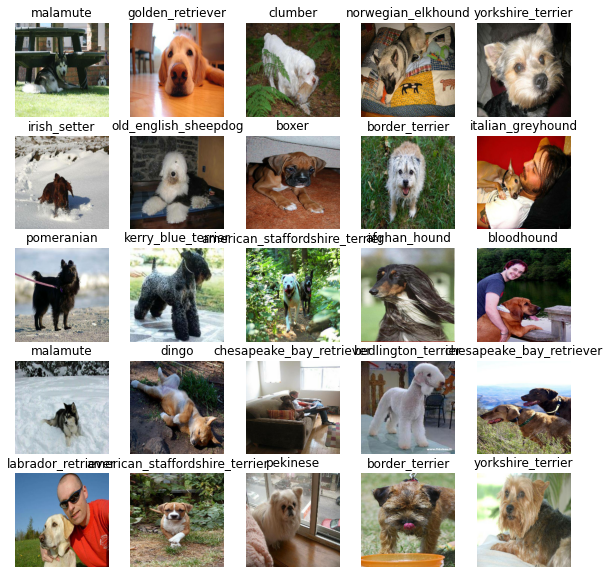

In [171]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

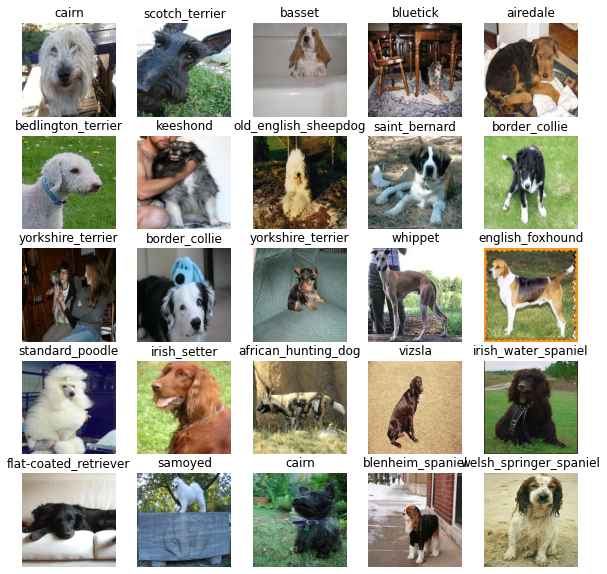

In [172]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

#### **Creating and training a model**

Now that the data is ready, I am going to prepare it for modelling using an existing model from [TensorFlow Hub](https://tfhub.dev/). TensorFlow Hub is a resource where you can find many different pretrained machine learning models. Using a pretrained machine learning model is what's referred to as **transfer learning**.

##### **How to choose a model?**

Since my problem is an image classification problem (classifying different dog breeds), I can navigate to the [TensorFlow Hub](https://tfhub.dev/s?module-type=image-augmentation,image-classification,image-feature-vector,image-generator,image-object-detection,image-others,image-style-transfer,image-rnn-agent)  page by problem domain (image). I start by choosing the image problem domain, and then filter it down by subdomains, in this case, [image classification](https://tfhub.dev/s?module-type=image-classification).

Doing this gives me a list of different pretrained models to use for my task. Clicking on one gives me information about the model as well as instructions for using it.

For example, clicking on the [mobilenet_v2_130_224](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) model, tells me this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

#### **Building a model**

Before I can build a model, there are a few things needing to be defined:
* The input shape (images, in the form of Tensors).
* The output shape (image labels, in the form of Tensors).
* The URL of the model to use.

All of this is pretty standard practice with whatever machine learning model one uses. And because I'm using TensorFlow, everything will be in the form of Tensors.


In [173]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now that I have the inputs, outputs and model ready to go, I am going to put them all together into a **Keras deep learning model** in the form of a function that:

1. Takes the input shape, output shape and the model as parameters.
2. Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
3. Compiles the model (says it should be evaluated and improved).
4. Builds the model (tells the model the input shape it'll be getting).
5. Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [174]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

The above explained...

#### **Setting up the model layers** *(Define the model)*

- There are two ways to do this in Keras, the [functional](https://www.tensorflow.org/guide/keras/functional) and [sequential API](https://www.tensorflow.org/guide/keras/overview#build_a_simple_model). I've used the sequential. Which one should you use?

- The Keras documentation states the functional API is the way to go for defining complex models but the sequential API (a linear stack of layers) is perfectly fine for getting started.

- The first layer is the model from TensorFlow Hub (`hub.KerasLayer(MODEL_URL)`). So the first layer is actually an entire model in itself (many more layers). This **input layer** takes in my images and then finds patterns in them based on the patterns [`mobilenet_v2_130_224`](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) has found.

- The next layer (`tf.keras.layers.Dense()`) is the **output layer** of the model. It brings all of the information discovered in the input layer together and outputs it in the shape I am after, 120 (the number of unique labels).

- The `activation="softmax"` parameter tells the output layer that I would like to assign a probability value [between 0 and 1](https://en.wikipedia.org/wiki/Softmax_function) to each of the 120 labels. The higher the value, the more the model believes the input image should have that label. If this was a binary classification problem, I would use `activation="sigmoid"`.

- For more on which activation function to use, see the article: [Which Loss and Activation Functions Should I Use?](https://towardsdatascience.com/deep-learning-which-loss-and-activation-functions-should-i-use-ac02f1c56aa8)

#### **Compiling the model** *(Define how the model is going to learn)*

Let's say I am taking part in an international ski championship. The catch is I'm blindfolded. Luckily, my friend Adam is standing at the bottom of the slope shouting instructions on how to get down safely. At the bottom of the hill there's a judge evaluating how I'm doing. They know where I need to end up so they compare how I'm doing to where I'm supposed to be. Their comparison is how I get scored.

Transferring this to `model.compile()` terminology:
- `loss` - The height of the slope is the loss function, the models goal is to minimize this, getting to 0 (the bottom of the slope) means the model is learning perfectly.
- `optimizer` - Adam is the optimizer, he's the one telling you how to navigate the slope (lower the loss function) based on what you've done so far. His name is Adam because the [Adam optimizer](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) is a great general which performs well on most models. Other optimizers include [RMSprop](https://ruder.io/optimizing-gradient-descent/index.html#rmsprop) and [Stochastic Gradient Descent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent).
- `metrics` - This is the onlooker at the bottom of the slope rating how well your perfomance is. Or in my case, giving the accuracy of how well my model is predicting the correct image label.

#### **Building the model**

- `model.build()` is used whenever a layer from TensorFlow Hub is selected to tell the model what input shape it can expect.

- In this case, the input shape is `[None, IMG_SIZE, IMG_SIZE, 3]` or `[None, 224, 224, 3]` or `[batch_size, img_height, img_width, color_channels]`.

- Batch size is left as `None` as this is inferred from the data passed to the model. In this case, it will be 32 since that is what the data batch size has been set to.

- Calling `summary()` on the model to get an idea of what the model looks like.

In [175]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_1 (KerasLayer)   multiple                  5432713   
_________________________________________________________________
dense_1 (Dense)              multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


**Note:** The non-trainable parameters are the patterns learned by `mobilenet_v2_130_224` and the trainable parameters are the ones in the dense layer I added. This means the main bulk of the information in my model has already been learned and I am going to take that and adapt it to my own problem.

#### **Creating callbacks**

Callbacks are helper functions a model can use during training to do things such as saving its progress, checking its progress or stopping the training early if the model stops improving. I will be creating two callbacks:

1. For **TensorBoard** which helps track the models progress
2. For **Early stopping** which prevents the model from training for too long.

##### **TensorBoard Callback**

Three things are required to setup a TensorBoard callback:
1. Load the [TensorBoard](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard) notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` function.
3. Visualize the models training logs with the `%tensorboard` magic function (I will do this after model training).

In [176]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [177]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Projects/Dog Breed Classification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

##### **Early Stopping Callback**

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do *so well* at finding patterns in a certain dataset that it is not able to use those patterns on another dataset it hasn't seen before (i.e. does not generalize).

*...It's basically like saying to our model, *"keep finding patterns until the quality of those patterns starts to go down."*



In [178]:
# Create early stopping (once model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

#### **Training a model (on a subset of data)**
My first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data. I do this to make sure everything is working. And if it is, I can step it up later and train on the entire training dataset.

The final parameter needing to be defined before training is `NUM_EPOCHS` (also known as **number of epochs**).

- `NUM_EPOCHS` defines how many passes of the data the model should do. A pass is equivalent to the model trying to find patterns in each dog image and see which patterns relate to each label.

- If `NUM_EPOCHS=1`, the model will only look at the data once and will probably score badly because it has not had a chance to correct itself. *(It would be like competing in the ski championships and your friend Adam only being able to give you 1 single instruction to get down the slope)*

- What is a good value for `NUM_EPOCHS`? This is hard to say. 10 could be a good start but so could 100. This is one of the reasons I created an early stopping callback. Having early stopping setup means if I set `NUM_EPOCHS` to 100 but the model stops improving after 22 epochs, it will stop training.

In [179]:
# Check again if GPU is available (otherwise computing will take a very long time)
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [180]:
# How many rounds should the model look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

The GPU is running and NUM_EPOCHS are setup. Now to create a simple function which trains a model. The function will:

- Create a model using `create_model()`.
- Setup a TensorBoard callback using `create_tensorboard_callback()` (creating a log directory of current date and time).
- Call `fit()` function on the model passing it the training data, validatation data, number of epochs to train for and callbacks to use.
- Return the fitted model.

In [181]:
# Function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model() # Function created above

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback() # Function created above

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  # Return fitted model
  return model

**Note:** When training a model for the first time, the first epoch will take a while to load compared to the rest. This is because the model is getting ready and the data is being initialised. Using more data will generally take longer, which is another reason why starting with ~1000 images is a good idea. After the first epoch, subsequent epochs should only take a few seconds.

In [182]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 441s 18s/step - loss: 4.7014 - accuracy: 0.0862 - val_loss: 3.6083 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 7s 276ms/step - loss: 1.6696 - accuracy: 0.6800 - val_loss: 2.2838 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 6s 258ms/step - loss: 0.5837 - accuracy: 0.9400 - val_loss: 1.7929 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 7s 262ms/step - loss: 0.2591 - accuracy: 0.9850 - val_loss: 1.6009 - val_accuracy: 0.5750
Epoch 5/100
25/25 [==============================] - 6s 251ms/step - loss: 0.1494 - accuracy: 0.9950 - val_loss: 1.5076 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 6s 255ms/step - loss: 0.1025 - accuracy: 1.0000 - val_loss: 1.4617 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================

**Note:** It looks like the model might be overfitting (getting far better results on the training set than the validation set). Overfitting to begin with is a good thing. It means the model is learning something. 


#### **Checking the TensorBoard logs**

The TensorBoard magic function (`%tensorboard`) will access the logs directory created earlier and viualize its contents.

In [183]:
%tensorboard --logdir drive/My\ Drive/Projects/Dog\ Breed\ Classification/logs

Reusing TensorBoard on port 6006 (pid 884), started 6:12:22 ago. (Use '!kill 884' to kill it.)

<IPython.core.display.Javascript object>

**Note:** Thanks to the early_stopping callback, the model stopped training after 20 epochs. This is because the validation accuracy failed to improve for 3 epochs in row. The model is definitely learning something. The validation accuracy got to 65% in a few minutes. This means, if I was to scale up the number of images, I would likely see the accuracy increase as well.

#### **Making and evaluating predictions using the trained model**

Before scaling up and training on more data, there are some other ways to evaluate the models performance. Although accuracy is a pretty good indicator of how the model is doing, it would be even better to see it in action.

Making predictions with a trained model is as easy as calling `predict()` on it and passing it data in the same format the model was trained on.

In [184]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 164ms/step


array([[1.9878335e-03, 6.4677035e-05, 1.2069948e-03, ..., 1.3640321e-04,
        2.5031211e-05, 3.4401347e-03],
       [3.4265162e-04, 5.3205417e-04, 1.1223810e-02, ..., 4.8039155e-04,
        6.1830445e-03, 3.8146856e-04],
       [3.7226044e-05, 3.9508315e-05, 2.1213431e-05, ..., 1.0777770e-05,
        2.9243673e-05, 1.4929278e-04],
       ...,
       [2.3460858e-05, 2.5461668e-05, 1.1101780e-05, ..., 5.2427840e-06,
        2.1050175e-04, 2.2472113e-05],
       [1.4053272e-03, 1.2474411e-04, 3.5800676e-05, ..., 5.6123656e-05,
        1.4775006e-05, 6.9894134e-03],
       [2.3133869e-03, 4.5943616e-05, 3.2192147e-03, ..., 2.2029269e-03,
        9.9875289e-04, 4.2042870e-05]], dtype=float32)

In [185]:
# Check the shape of predictions
predictions.shape

(200, 120)

In [186]:
len(y_val)

200

In [187]:
len(unique_breeds)

120

- Making predictions with the model returns an array with a different value for each label.
- In this case, making predictions on the validation data (200 images) returns an array (`predictions`) of arrays, each containing 120 different values (one for each unique dog breed).
- These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog.
- The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Converting an array of probabilities into an actual label, in practice:

In [188]:
# First prediction (Output: probability value for each image of likelihood being a certain label)
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[1.98783353e-03 6.46770350e-05 1.20699476e-03 2.05216966e-05
 2.45109608e-04 9.11954921e-05 1.33564072e-02 1.78724600e-04
 4.81477982e-05 1.01342192e-03 1.48662933e-04 7.85488082e-05
 4.52756445e-04 1.37950570e-04 1.31749694e-04 2.40628142e-04
 8.80022053e-05 2.53238101e-02 7.61495394e-05 8.31384750e-05
 5.68612944e-04 4.66680467e-05 5.09699839e-06 2.18463573e-03
 1.27286519e-04 3.24207649e-04 1.61639780e-01 2.34674124e-04
 1.49007494e-04 1.84771570e-03 4.40310105e-05 7.70696206e-04
 5.73123456e-04 1.76760004e-05 1.55551257e-04 3.89287472e-02
 2.78244352e-05 3.72780138e-04 8.42816589e-05 2.37160766e-05
 7.88847264e-03 1.34064730e-05 1.52464519e-04 2.33299201e-04
 1.38753358e-05 4.78513102e-05 4.36941955e-05 1.36241739e-04
 9.07399575e-04 6.00391395e-05 6.30224458e-05 5.77589253e-06
 2.76479026e-04 1.19137803e-04 2.08286612e-04 1.56710958e-05
 4.66860773e-04 1.50167930e-03 4.23135905e-04 2.59485394e-01
 1.83409458e-04 5.48452117e-05 3.16789374e-04 6.53237885e-06
 4.93563828e-04 3.704892

Build a function to combine prediction probabilities with labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [189]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'irish_wolfhound'

Now that I have a list of all the different predictions the model has made, I will do the same for the validation images and validation labels.

**Note:** The model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. I can use the validation images to visually compare the models predictions with the validation labels.

Since the validation data (`val_data`) is in batch form, to get a list of validation images and labels, I will have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

In [190]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

The following is now available:
* Prediction labels
* Validation labels (truth labels)
* Validation images

I am going to create a set of functions to visualize the outputs. More specifically, I want to be able to view an image, its predicted label and its actual label (true label).

The first function will:
* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [191]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

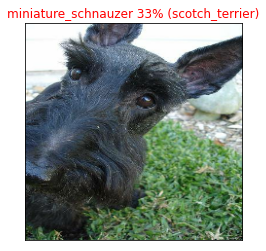

In [193]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Since this is a multi-class problem (120 different dog breeds), it would be good to see what other guesses the model is making. More specifically, if the model predicts a certain label with 24% probability, what else did it predict?

The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [194]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

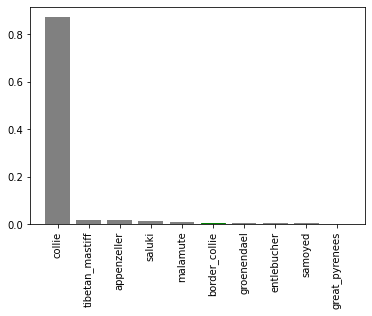

In [195]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

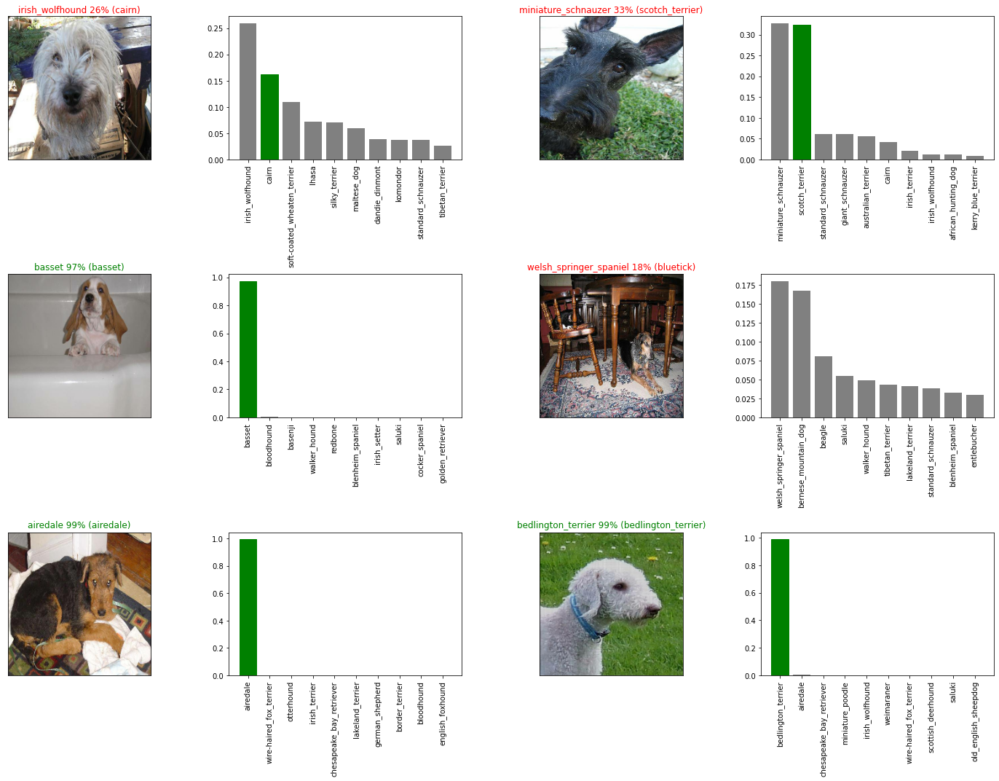

In [196]:
# Looking up a few of these predictions and their different values...
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#### **Saving and reloading a model**

After training a model, it is a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it. The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load).

Create a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory:

In [197]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Projects/Dog Breed Classification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

Create a function which can take a model path and use the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function to load it into a notebook:

**Note:** Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [198]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [200]:
# Save model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Projects/Dog Breed Classification/models/20200707-15521594137162-1000-images-Adam.h5...


'drive/My Drive/Projects/Dog Breed Classification/models/20200707-15521594137162-1000-images-Adam.h5'

In [211]:
# Load model trained on 1000 images
model_1000_images = load_model('drive/My Drive/Projects/Dog Breed Classification/models/20200707-15521594137162-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/Projects/Dog Breed Classification/models/20200707-15521594137162-1000-images-Adam.h5


Just to be sure it worked, compare the two models (the original one and the loaded one) using the `evaluate()` method.

In [212]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 178ms/step - loss: 1.3031 - accuracy: 0.6450


[1.3031033277511597, 0.6449999809265137]

In [213]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 169ms/step - loss: 1.3031 - accuracy: 0.6450


[1.3031033277511597, 0.6449999809265137]

#### **Training a model (on the full data)**

The model works on a subset of data. Time to move forward with training a model on the full data.

Above, all of the training filepaths were stored in `X` and all of the training labels were stored in `y`. Double check this.

In [205]:
# Reminder of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [206]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


In [207]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [208]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** To monitor the model whilst it trains, load TensorBoard (it should update every 30-seconds or so whilst the model trains).

In [209]:
%tensorboard --logdir drive/My\ Drive/Projects/Dog\ Breed\ Classification/logs

Reusing TensorBoard on port 6006 (pid 884), started 6:30:13 ago. (Use '!kill 884' to kill it.)

<IPython.core.display.Javascript object>

**Note:** Since running the cell below will cause the model to train on all of the data (10,000+) images, it will take a long time to get started and finish (~1 hour). However, thanks to the `full_model_early_stopping` callback, it'll stop before it starts going too long.

**Note:** The first epoch is always the longest as data gets loaded into memory. After it's there, it'll speed up.

In [210]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 5984s 19s/step - loss: 1.3302 - accuracy: 0.6761
Epoch 2/100
320/320 [==============================] - 64s 202ms/step - loss: 0.4008 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 66s 205ms/step - loss: 0.2364 - accuracy: 0.9360
Epoch 4/100
320/320 [==============================] - 65s 202ms/step - loss: 0.1496 - accuracy: 0.9677
Epoch 5/100
320/320 [==============================] - 67s 209ms/step - loss: 0.1065 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 66s 207ms/step - loss: 0.0780 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 64s 200ms/step - loss: 0.0585 - accuracy: 0.9905
Epoch 8/100
320/320 [==============================] - 65s 204ms/step - loss: 0.0452 - accuracy: 0.9960
Epoch 9/100
320/320 [==============================] - 66s 205ms/step - loss: 0.0380 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 66s 206m

#### **Saving and reloading the full model**

Even on a GPU, the full model takes a while to train. So it is a good idea to save it. This can be done using the `save_model()` function created earlier.

**Note:** It may be a good idea to incorporate the `save_model()` function into a `train_model()` function or to look into setting up a [checkpoint callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint).

In [214]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/My Drive/Projects/Dog Breed Classification/models/20200707-17561594144584-all-images-Adam.h5...


'drive/My Drive/Projects/Dog Breed Classification/models/20200707-17561594144584-all-images-Adam.h5'

In [215]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Projects/Dog Breed Classification/models/20200707-17561594144584-all-images-Adam.h5')

Loading saved model from: drive/My Drive/Projects/Dog Breed Classification/models/20200707-17561594144584-all-images-Adam.h5


#### **Making predictions on the test dataset**

The model has been trained on images in the form of Tensor batches. To make predictions on the test data, I will need to get it into the same format using the `create_data_batches()` created earlier. It takes a list of filenames as input and then converts them into Tensor batches.

To make predictions on the test data:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.

In [216]:
# Load test image filenames (since I am using os.listdir(), these already have .jpg)
test_path = "drive/My Drive/Projects/Dog Breed Classification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/My Drive/Projects/Dog Breed Classification/test/f2fb1e6cb9501847d0ab84f1edc36b78.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/ede0dddd46a46f8f6467b7fbd1b4958a.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/ee4c8303084840f4fa8ef6cc434dca91.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/eb3849def6fa245bcaae9ab9c64f024f.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/f14547a7bed40d4170bc70eafd1eb5e7.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/f0ee665e8ec8ee4b7b26984bebfdf356.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/ecca3983aa3cf5699ce3aa29c7899df8.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/f0f205d037fe626670165aca00fc8b81.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/ef0209bcfab48f72f71c9d1b8648aa45.jpg',
 'drive/My Drive/Projects/Dog Breed Classification/test/f0341ba6b21465ece32d7df0ebff3048.jpg']

In [217]:
# How many test images are there?
len(test_filenames)

10357

In [218]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


**Note:** Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour or more.

In [219]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 67s 207ms/step


In [220]:
# Check out the test predictions
test_predictions[:10]

array([[2.0999674e-07, 2.4737550e-09, 1.9023505e-08, ..., 6.5555483e-10,
        1.2536568e-04, 1.7768454e-06],
       [7.5699420e-09, 7.2182482e-09, 2.2331180e-08, ..., 4.8478781e-09,
        1.1775067e-05, 1.8941180e-05],
       [9.3786818e-09, 1.5430077e-11, 3.9099643e-10, ..., 5.2330513e-09,
        1.1716155e-06, 1.9701635e-07],
       ...,
       [9.0056265e-14, 3.8273296e-10, 2.3688209e-11, ..., 1.0991238e-10,
        2.9182980e-08, 3.9962207e-11],
       [7.4795805e-09, 1.1833141e-07, 2.2565998e-11, ..., 5.6043784e-11,
        1.3730231e-09, 5.3241087e-09],
       [1.8037719e-08, 1.6523973e-09, 2.8753203e-11, ..., 1.1874272e-12,
        1.1219324e-09, 2.4039215e-09]], dtype=float32)

#### **Preparing test dataset predictions for Kaggle submission**

Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), the models output probabilities must be given for each label along with the image ID's.

To get the data in this format:
*   Create a pandas DataFrame with an ID column as well as a column for each dog breed.
*   Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [221]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [222]:
# Append test image ID's to predictions DataFrame
test_path = "drive/My Drive/Projects/Dog Breed Classification/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f2fb1e6cb9501847d0ab84f1edc36b78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ede0dddd46a46f8f6467b7fbd1b4958a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ee4c8303084840f4fa8ef6cc434dca91,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,eb3849def6fa245bcaae9ab9c64f024f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f14547a7bed40d4170bc70eafd1eb5e7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [223]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f2fb1e6cb9501847d0ab84f1edc36b78,2.09997e-07,2.47375e-09,1.90235e-08,1.25926e-05,3.06183e-07,9.30146e-12,0.955213,6.3002e-08,9.12874e-09,6.35413e-09,4.46986e-11,2.48618e-07,2.97746e-08,1.72219e-09,7.97758e-09,5.62695e-10,1.00185e-07,7.17089e-09,7.50606e-11,4.57711e-10,3.73609e-09,3.59788e-10,2.61629e-07,6.66915e-07,7.95182e-10,7.96018e-10,2.05889e-06,9.85954e-09,2.79801e-10,2.5373e-08,8.90907e-08,2.59171e-10,7.03979e-09,1.52445e-08,3.37194e-11,0.000117549,1.23894e-09,1.27895e-08,1.64853e-08,...,9.90821e-09,0.0106863,3.09722e-09,1.02093e-05,3.36487e-09,2.75845e-08,3.55735e-06,2.49338e-07,1.4915e-11,5.04414e-12,2.69819e-11,1.03143e-10,4.01251e-11,2.56554e-12,1.44498e-09,1.30309e-07,4.64068e-08,1.85583e-08,1.05664e-08,6.60403e-09,1.07368e-09,3.46669e-11,1.99789e-05,1.22322e-10,1.8762e-08,3.77766e-10,2.82462e-09,5.31294e-08,5.34587e-10,2.09988e-07,2.62288e-09,8.86452e-08,2.14539e-08,3.79397e-10,1.51015e-10,1.10961e-08,1.64275e-06,6.55555e-10,0.000125366,1.77685e-06
1,ede0dddd46a46f8f6467b7fbd1b4958a,7.56994e-09,7.21825e-09,2.23312e-08,3.17179e-07,1.15248e-07,2.58513e-07,3.42078e-08,1.55796e-09,1.69522e-07,2.30945e-05,1.67681e-10,1.40673e-06,5.88905e-08,4.79489e-08,1.30619e-09,5.49569e-06,0.00147664,1.10297e-08,2.86193e-08,4.39056e-06,4.31739e-10,8.79245e-09,4.12403e-10,1.98302e-08,0.289657,3.87715e-08,2.01075e-06,1.90633e-09,6.09243e-09,1.21557e-05,1.11542e-09,2.23431e-05,0.00109647,3.46389e-05,1.6017e-07,2.58615e-06,8.00038e-09,1.53669e-09,9.71989e-09,...,2.36685e-07,2.11557e-08,1.36971e-08,2.16171e-05,5.75479e-07,6.92768e-08,3.60023e-09,2.02453e-08,4.09667e-09,1.81537e-09,7.57952e-12,1.37778e-10,1.9926e-08,2.09606e-07,2.49575e-07,2.52092e-07,7.27811e-08,8.92629e-07,1.435e-07,9.50843e-07,4.64561e-07,8.95451e-08,2.90948e-06,2.26772e-09,8.63108e-07,1.04344e-05,1.8506e-06,3.37086e-05,6.50196e-09,3.08774e-07,4.44785e-08,7.04259e-08,5.80682e-05,1.00768e-07,8.03856e-09,2.59467e-05,2.84781e-07,4.84788e-09,1.17751e-05,1.89412e-05
2,ee4c8303084840f4fa8ef6cc434dca91,9.37868e-09,1.54301e-11,3.90996e-10,1.45538e-07,3.37964e-10,4.63022e-10,1.36759e-05,1.06604e-09,6.30673e-12,6.10995e-10,8.65051e-11,6.92827e-11,4.21434e-10,9.87208e-10,3.03228e-09,8.86921e-10,2.01625e-08,0.000159846,6.97571e-10,7.27074e-11,9.39108e-11,3.4036e-12,1.25579e-06,1.48094e-09,1.92224e-09,1.95968e-08,1.24736e-09,2.86395e-10,1.22482e-09,2.93787e-10,2.17893e-09,1.21219e-10,5.77389e-11,5.74058e-10,3.64016e-10,4.56532e-07,2.3965e-09,1.21264e-10,1.24677e-10,...,2.23137e-10,0.000406873,1.47611e-11,5.66633e-06,5.11456e-11,2.06246e-09,5.76124e-09,1.44494e-10,2.8946e-11,9.23693e-11,1.73409e-10,7.04838e-10,1.38447e-10,2.59132e-13,2.34624e-12,1.05939e-08,1.60036e-10,6.46377e-07,7.84571e-08,3.99938e-11,1.35234e-10,1.66397e-11,6.32637e-08,1.06223e-08,4.54565e-08,1.05306e-11,5.3955e-07,8.44207e-09,1.02163e-10,1.57121e-11,7.59499e-11,4.70095e-09,1.27337e-08,2.39033e-10,6.2501e-12,6.09018e-11,4.

Now export our predictions DataFrame to CSV so we can submit it to Kaggle.

In [224]:
preds_df.to_csv("drive/My Drive/Projects/Dog Breed Classification/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

#### **Making predictions on custom images**

Now that I was able to make predictions on a test dataset already provided, I can use my trained model to make prediction on my own images.

To do so:
* Get the filepaths of the images.
* Turn the filepaths into data batches using `create_data_batches()`. And since the custom images won't have labels, the `test_data` parameter must be set to `True`.
* Pass the custom image data batch to the model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I have uploaded pictures to a directory located at `drive/My Drive/Projects/Dog Breed Classification/my-dog-photos/` (as seen in the cell below).

In [225]:
# Get custom image filepaths
custom_path = "drive/My Drive/Projects/Dog Breed Classification/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [226]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [227]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [228]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['standard_poodle', 'english_setter', 'great_dane']

In [229]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

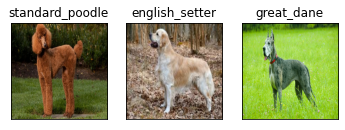

In [230]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)